# Generate mesh for RRM
This notebook is intended to do the following:
* define the refinement region for an RRM grid and save it as a mask to be used by SQuadGen for the refinement step.
* generate several different levels of refinement in that region (using SQuadgen)
* plot these regionally refined meshes

The resulting output can be used in conjunction with the other scripts in this directory to generate all additional mapping and domain files needed to run an E3SM case.

This notebook builds on Ben Hillman's https://github.com/brhillman/e3sm_grids/blob/master/notebooks/create_mesh.ipynb and https://eagles-project.atlassian.net/wiki/spaces/Testbeds/pages/9601025/Instructions+followed+for+setting+up+RRM+Grids+using+the+Physics+Grid+PG+approach

_Author_: Chris Jones (christopher.jones@pnnl.gov)

In [45]:
from subprocess import run
import os
from glob import glob
import matplotlib.pyplot as plt
from matplotlib import collections, patches
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
import numpy as np
%matplotlib inline

In [2]:
exterior_resolution = 32  # ne32 is the coarse resolution

# point to tempest executable if not already on PATH
generate_csmesh_exe = '/global/homes/c/crjones/git_repos/tempestremap/bin/GenerateCSMesh'

In [3]:
# Create an ne32 mesh for a base; use tempestremap for this
os.makedirs('meshes', exist_ok=True)
res = exterior_resolution

run(f'{generate_csmesh_exe} --res {res} --file meshes/ne{res}.g'.split(' '),
    capture_output=True)

CompletedProcess(args=['/global/homes/c/crjones/git_repos/tempestremap/bin/GenerateCSMesh', '--res', '32', '--file', 'meshes/ne32.g'], returncode=0, stdout=b'Parameters:\n  --res <integer> [32] \n  --file <string> ["meshes/ne32.g"] \n  --out_format <string> ["Netcdf4"] \n  --alt <bool> [false] \n=========================================================\n..Generating mesh with resolution [32]\n..Writing mesh to file [meshes/ne32.g] \nNodes per element\n..Block 1 (4 nodes): 6144\n..Mesh generator exited successfully\n=========================================================\n', stderr=b'')

In [4]:
ds_ne32 = xr.open_dataset('meshes/ne32.g')

In [5]:
## Helper plotting functions
def get_grid_details(ds, verbose=True):
    # cartesian coordinates (radians?)
    x = ds['coord'][0,:].squeeze()
    y = ds['coord'][1,:].squeeze()
    z = ds['coord'][2,:].squeeze()

    # convert to longitude and latitude
    lon = np.arctan2(y, x) * 180.0 / np.pi
    lat = np.arcsin(z) * 180.0 / np.pi

    if verbose:
        print('Number of vertices: %i'%lon.size)
        print('Longitude range: %i to %i'%(lon.min().values, lon.max().values))
        print('Latitude range: %i to %i'%(lat.min().values, lat.max().values))

    # corner indices
    corner_indices = ds['connect1']

    # plot polygon edges as line collection; seems to be faster than using ax.plot()
    xx = lon[corner_indices[:,:] - 1]
    yy = lat[corner_indices[:,:] - 1]
    lines = [[[xx[i,j], yy[i,j]] for j in range(xx.shape[1])] for i in range(xx.shape[0])]
    
    return lat, lon, lines, xx, yy, corner_indices

def plot_exodus(ds, ax=None, verbose=False, **plot_kwargs):
    # set up the axes and map
    if ax is None: 
        ax = plt.subplot(projection=ccrs.PlateCarree())
        ax.set_global()

        # add ocean and land fills
        ax.add_feature(cfeature.OCEAN, zorder=0)
        ax.add_feature(cfeature.LAND, zorder=0)

    # extract relevant details from ds grid:
    lat, lon, lines, xx, yy, corner_indices = get_grid_details(ds, verbose=verbose)

    
    if 'color' not in plot_kwargs.keys():
        plot_kwargs['color'] = 'black'
        
    # plot polygon edges as line collection; seems to be faster than using ax.plot()
    # xx = lon[corner_indices[:,:] - 1]
    # yy = lat[corner_indices[:,:] - 1]
    # lines = [[[xx[i,j], yy[i,j]] for j in range(xx.shape[1])] for i in range(xx.shape[0])]
    line_collection = collections.LineCollection(lines, transform=ccrs.Geodetic(), **plot_kwargs)
    pl = ax.add_collection(line_collection)

    return pl, ax

# Approaches to defining the grid refinement region
I've explored a few ways to define the grid refinement region:
1. Simple rectangular lat-lon box:
2. A polygon that vaguely follows the contours of the spectral elements on the cubed sphere.
3. The convex hull of the spectral element boundaries interior to a polygon.
4. The spectral element boundaries interior to a polygon.

I've elected to go with option _4_, but I'm not sure there's good reason to prefer that over the others. The reason I chose it is partly from guidance found in earlier versions of RRM grid generation instructions: "For best results the border should follow the grid lines, or go at a 45 degree angle (i.e. over 1 element, then down 1 element, and repeat) ... Plot the final grid and make sure it does not have any highly deformed elements", but mostly I just think the resulting refined mesh looks better. 

Examples from all approaches will be outlined.

In [6]:
# Use shapely for more sophisticated geometry tools
from shapely.geometry import Point
from shapely.geometry import MultiPoint
from shapely.ops import unary_union
from shapely.geometry import box
from shapely.geometry import Polygon

In [7]:
def plot_refinement_patch(geom, save_name=None):
    # Just make a simple png with our refinement area and plug that into squadgen, 
    # no interaction with image editing software required.
    figure = plt.figure(figsize=(20, 10))
    figure.patch.set_alpha(0)

    ax = figure.add_subplot(111, projection=ccrs.PlateCarree())
    if save_name is None:
        ax.stock_img() # uncomment if you want to confirm where the patch is geographically
    ax.set_global()
    ax.outline_patch.set_visible(False)
    ax.background_patch.set_visible(False)
    ax.background_patch.set_alpha(0)
    
    # NOTE: making the refinement patch black here instead of white because I had trouble getting
    # a transparent background. Need to pass --invert to SQuadGen below with this image.
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), color='black')
    ax.axis('off')
    if save_name is not None:
        figure.savefig(save_name, bbox_inches='tight', pad_inches=0.0)
    return figure, ax

In [46]:
def call_squadgen(refine_file, output_file, res='32', refine_level='2', smooth_iter='20', smooth_dist='3'):
    exec_file = '/global/homes/c/crjones/git_repos/SQuadgen/SQuadGen'
    run([exec_file, '--resolution', res,
         '--refine_file', refine_file,
         '--refine_level', refine_level,
         '--invert', '--smooth_type', 'SPRING',
         '--smooth_iter', smooth_iter,
         '--smooth_dist', smooth_dist,
         '--output', output_file],
        capture_output=True)

In [15]:
def plot_mesh_and_region(ds, region=None, central_loc=None, **plot_kwargs):
    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
    ax.stock_img()
    ax.coastlines()
    ax.set_global()
    pl, ax = plot_exodus(ds, ax=ax, verbose=True, linewidth=0.1, **plot_kwargs)

    if region:
        ax.add_geometries([region], crs=ccrs.PlateCarree(), facecolor = 'g', edgecolor='black', alpha=0.5)
    if central_loc:
        ax.plot(*central_loc, marker='o', color='red', markersize=6,
                alpha=0.7, transform=ccrs.Geodetic())
    return fig, ax

## Original ENA refined grid
Note: There is an existing ENA 4x refined grid in the E3SM project called `enax4v1`. I believe this was built for E3SMv1 and is not on the `pg2` physics grid.

Number of vertices: 8756
Longitude range: -180 to 180
Latitude range: -90 to 90


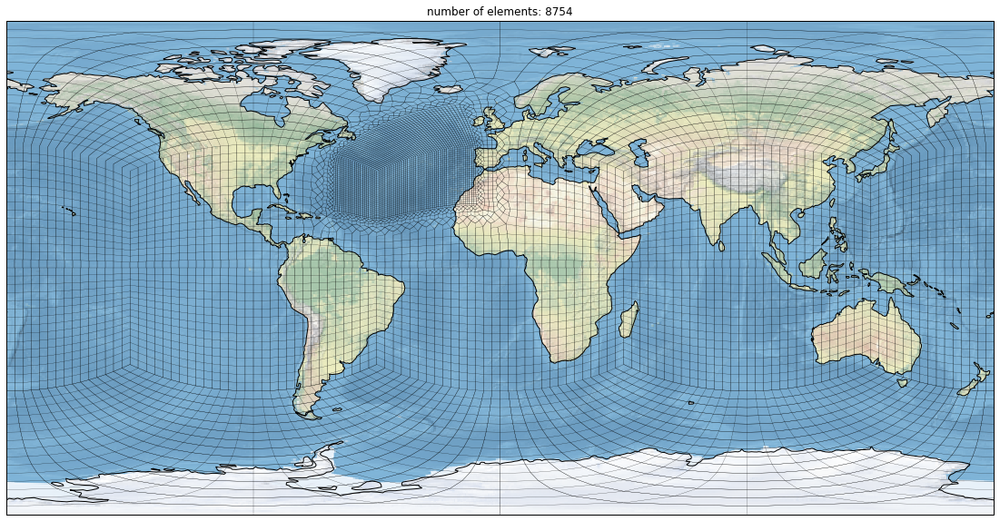

In [10]:
earlier_ena_mesh = '/global/cfs/cdirs/e3sm/inputdata/atm/cam/inic/homme/enax4v1.g'
ds_v0 = xr.open_dataset(earlier_ena_mesh)

figure = plt.figure(figsize=(20, 10))
ax = figure.add_subplot(111, projection=ccrs.PlateCarree())
ax.stock_img()
ax.coastlines()
ax.set_global()
ax.set_title(f'number of elements: {ds_v0.dims["num_elem"]}')
pl = plot_exodus(ds_v0, ax=ax, verbose=True, linewidth=0.2)

## Approach 1: Simple lat-lon box
The simplest approach is to just use a lat-lon box. Original working specifications were a 3000km by 3000 km box centered at ENA (39 5' 29.76"N, 28 1' 32.52" W).

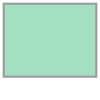

In [11]:
# simplest version: just make a box
central_loc = (-(28 + 1/60 + 32.52/3600), 39 + 5/60 + 29.76/3600)

lat_bounds = [25 + 33 / 60 + 72 / 3600, 52 + 35/60 + 3/3600]
lon_bounds = [-(45 + 9/60 + 35/3600), -(10 + 53/60 + 31/3600)]

my_region = box(lon_bounds[0], lat_bounds[0], lon_bounds[1], lat_bounds[1])
my_region

Number of vertices: 6146
Longitude range: -177 to 180
Latitude range: -90 to 90


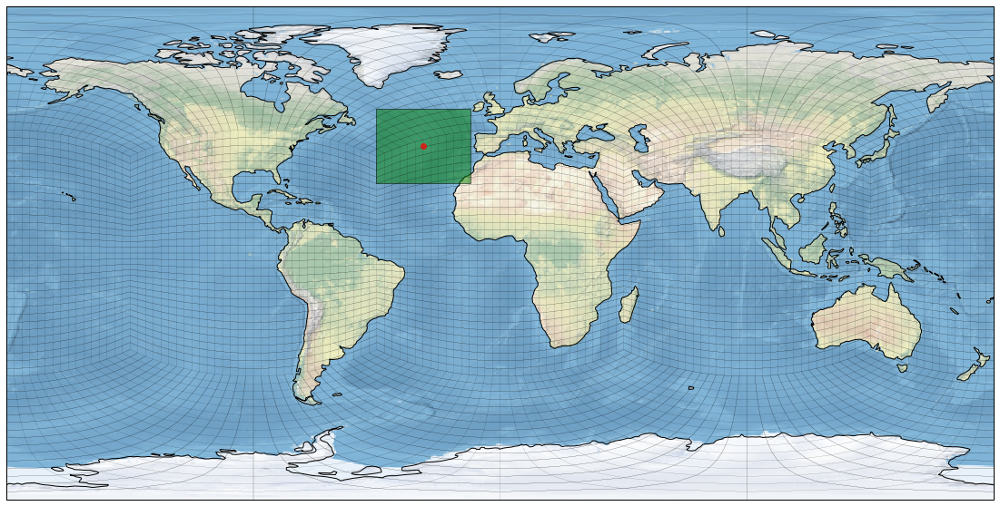

In [12]:
fig, ax = plot_mesh_and_region(ds_ne32, region=my_region, central_loc=central_loc)

(<Figure size 1440x720 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x2aaadfa68750>)

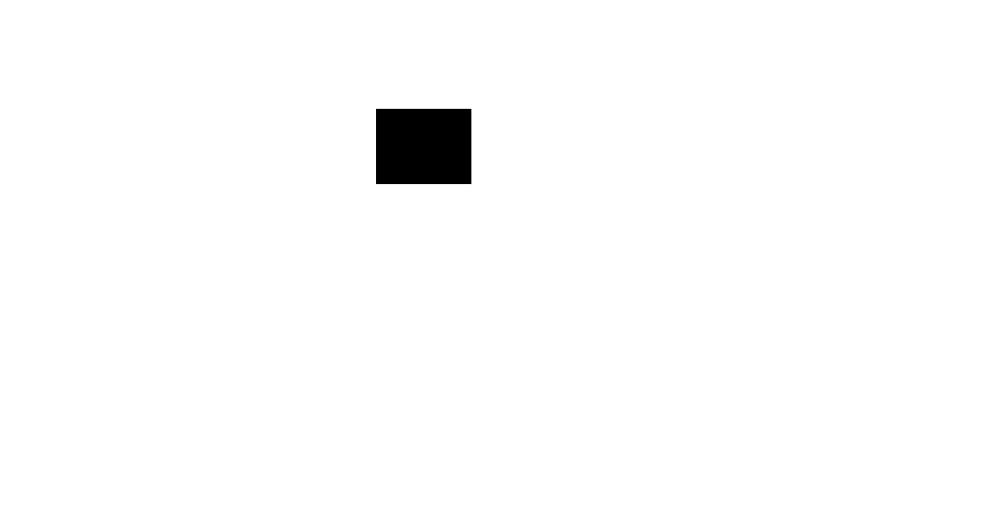

In [15]:
plot_refinement_patch(my_region, save_name='meshes/refinement_patch_box.png')

In [20]:
call_squadgen('meshes/refinement_patch_box.png', 'meshes/enax4_box.g')

Number of vertices: 9089
Longitude range: -177 to 180
Latitude range: -90 to 90


Text(0.5, 1.0, 'number of elements: 9087')

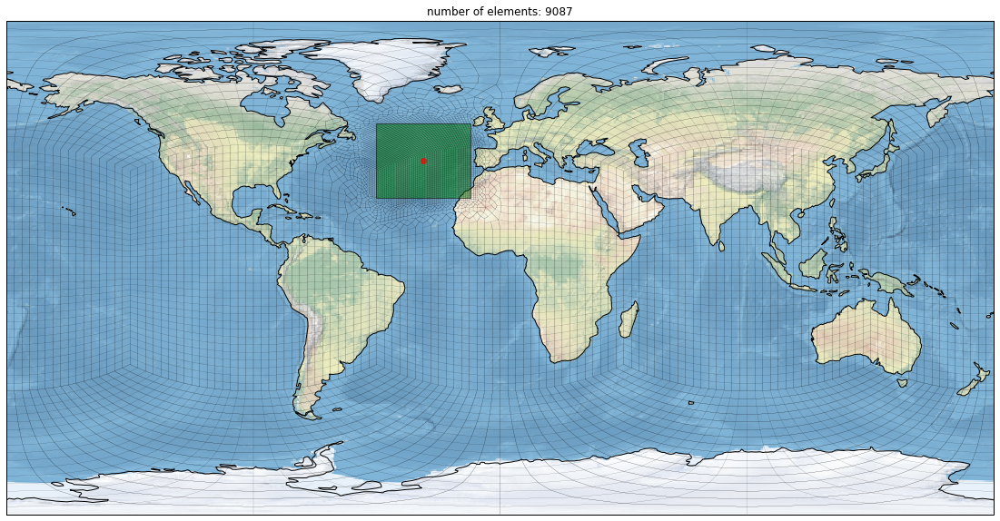

In [14]:
# Note that there's a lot of distortion in the output grid ...
ds_refined = xr.open_dataset('meshes/enax4_box.g')
fig, ax = plot_mesh_and_region(ds_refined, region=my_region, central_loc=central_loc)
ax.set_title(f'number of elements: {ds_refined.dims["num_elem"]}')

## Approach 2: Polygon roughly following contours of ne32 mesh
The region I chose here is concave in the lower left, but it basically follows the grid.

In [16]:
lat, lon, lines, xx, yy, corner_indices = get_grid_details(ds_ne32)

Number of vertices: 6146
Longitude range: -177 to 180
Latitude range: -90 to 90


Number of vertices: 6146
Longitude range: -177 to 180
Latitude range: -90 to 90


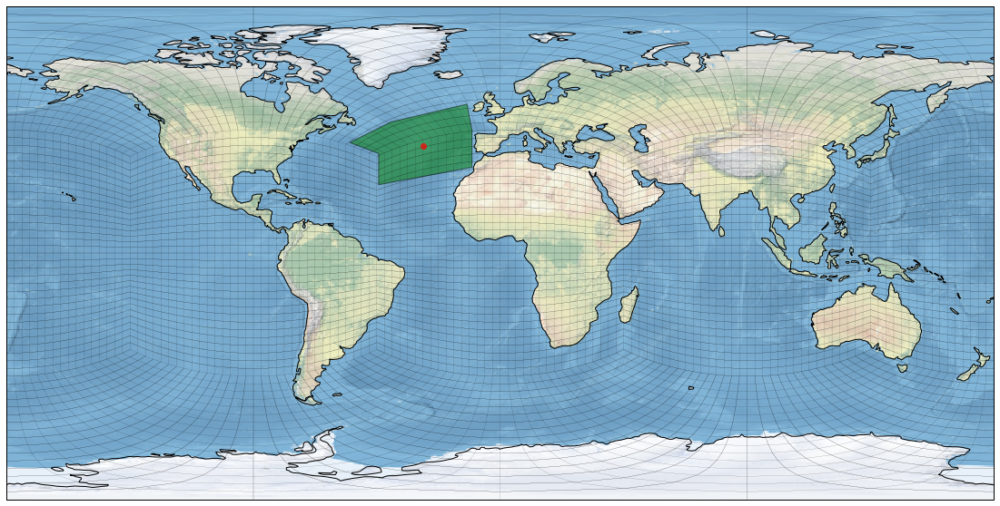

In [17]:
# More complicated version: 
# start messing with points to get a region that looks cool
vertices = ((-44.5, 25.1), (-10.5, 31.5), (-10.5, 45), (-12.3, 54.5), (-40, 48), (-55, 40.5), (-44.5, 36.5))
my_region_poly = Polygon(vertices)
fig, ax = plot_mesh_and_region(ds_ne32, region=my_region_poly, central_loc=central_loc)

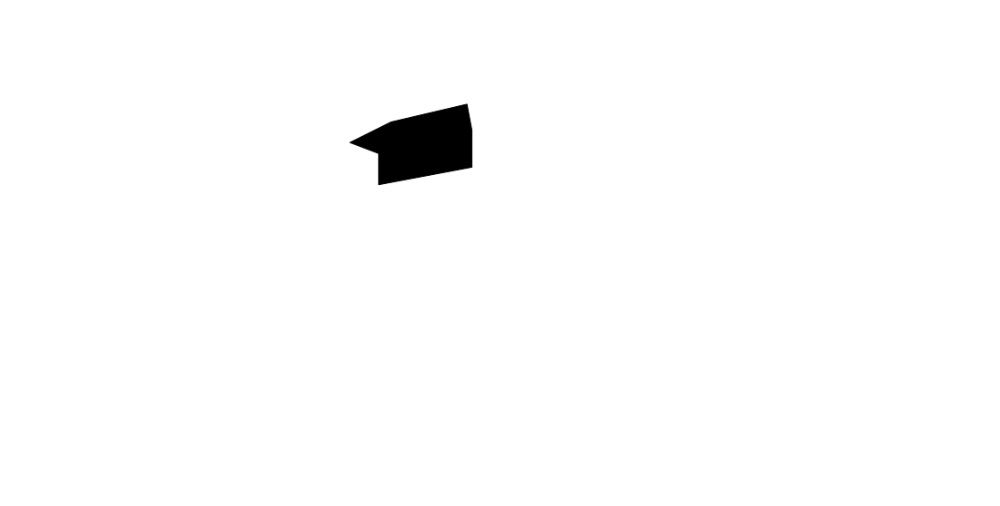

In [19]:
save_name = 'meshes/refinement_patch_polygon0.png'
mesh_name = 'meshes/enax4_polygon0.g'
plot_refinement_patch(my_region_poly, save_name=save_name)
call_squadgen(save_name, mesh_name)

Number of vertices: 8678
Longitude range: -177 to 180
Latitude range: -90 to 90


Text(0.5, 1.0, 'number of elements: 8676')

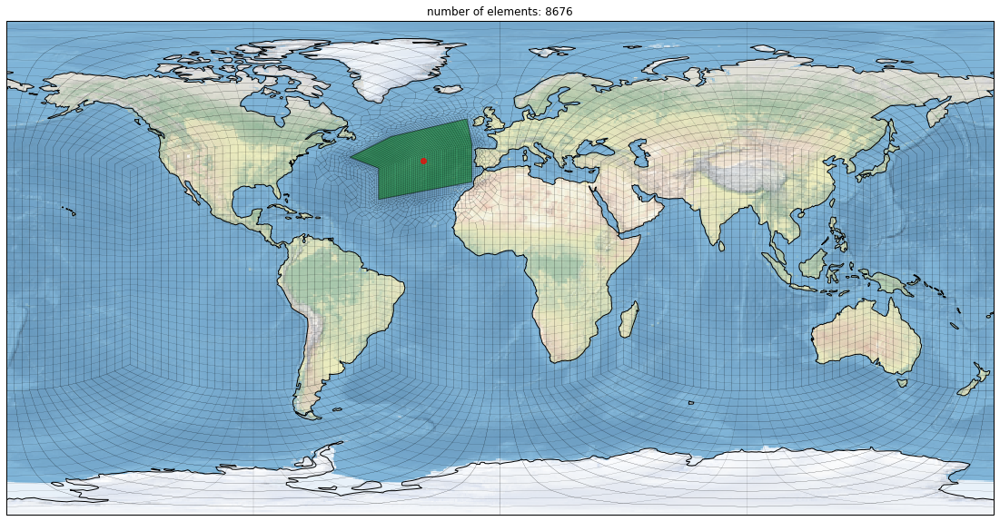

In [20]:
# To my eye, the elements don't look wildly distorted and are at least 
# comparable to `enax4v1`
ds_poly0 = xr.open_dataset('meshes/enax4_polygon0.g')
fig, ax = plot_mesh_and_region(ds_poly0, region=my_region_poly, central_loc=central_loc)
ax.set_title(f'number of elements: {ds_poly0.dims["num_elem"]}')

## Approach 3: Snap to elements within the refinement region
This grid was used in the successful RRM build and test run.

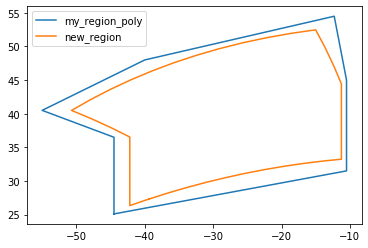

In [21]:
# More complicated version: 
# start messing with points to get a region that looks cool, then subset so 
# it aligns with the mesh
vertices = ((-44.5, 25.1), (-10.5, 31.5), (-10.5, 45), (-12.3, 54.5), (-40, 48), (-55, 40.5), (-44.5, 36.5))
my_region_poly = Polygon(vertices)

# version 2
plt.plot(*my_region_poly.exterior.xy, label='my_region_poly')

# version 3
interior_points = []
# add complete elements interior to my_region
for x, y in zip(xx, yy):
    trial_points = [Point(x0, y0) for x0, y0 in zip(x, y)]
    if all([my_region_poly.contains(tp) for tp in trial_points]):
        interior_points.extend(trial_points)

interior_elements = [Polygon(interior_points[4*i:(4*i+4)]) for i in range(len(interior_points) // 4)]
new_region = unary_union(interior_elements)
plt.plot(*new_region.exterior.xy, label='new_region')
plt.legend()

Number of vertices: 6146
Longitude range: -177 to 180
Latitude range: -90 to 90


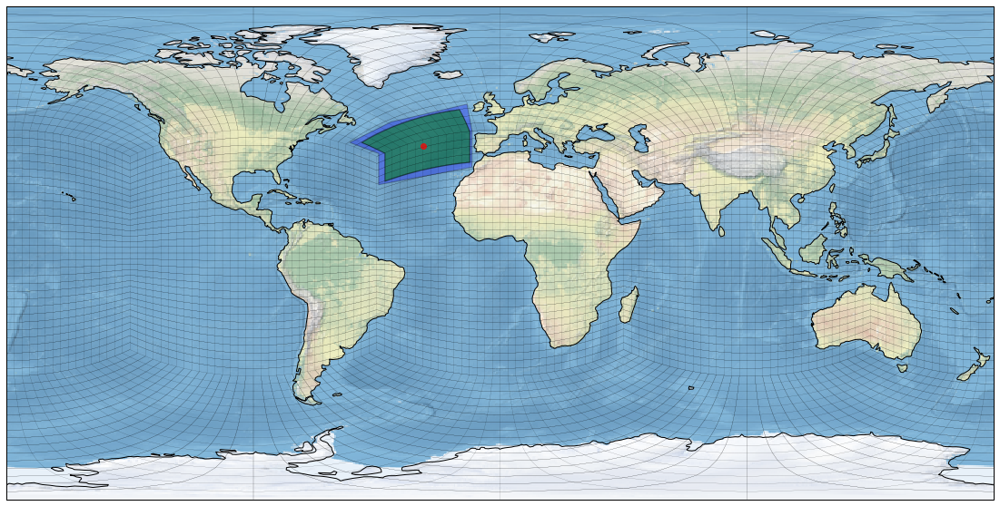

In [23]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
ax.stock_img()
ax.coastlines()
pl, ax = plot_exodus(ds_ne32, ax=ax, verbose=True, linewidth=0.1)

ax.add_geometries([my_region_poly], crs=ccrs.PlateCarree(), facecolor = 'b', edgecolor='black', alpha=0.3)
ax.add_geometries([new_region], crs=ccrs.PlateCarree(), facecolor = 'g', edgecolor='black', alpha=0.5)
ax.plot(*central_loc, marker='o', color='red', markersize=6,
        alpha=0.7, transform=ccrs.Geodetic())

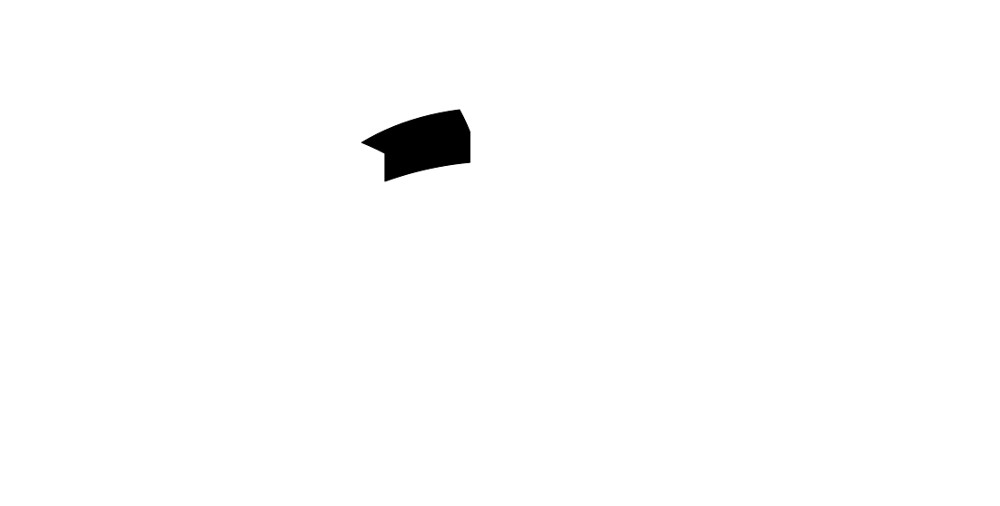

In [24]:
save_name = 'meshes/refinement_patch_se0.png'
mesh_name = 'meshes/enax4_se0.g'
plot_refinement_patch(new_region, save_name=save_name)
call_squadgen(save_name, mesh_name)

Number of vertices: 8550
Longitude range: -177 to 180
Latitude range: -90 to 90


Text(0.5, 1.0, 'number of elements: 8548')

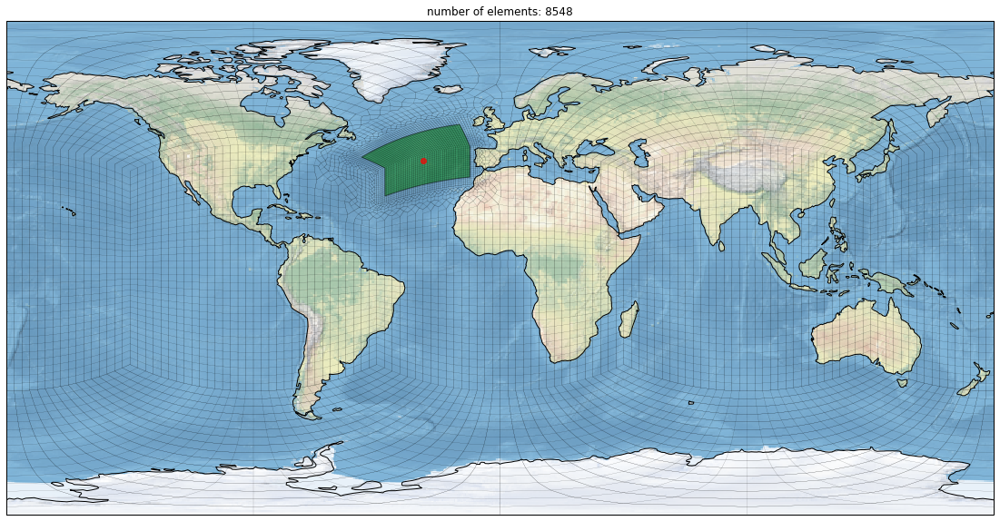

In [25]:
# To my eye, the elements don't look wildly distorted and are at least 
# comparable to `enax4v1`
ds_se0 = xr.open_dataset('meshes/enax4_se0.g')
fig, ax = plot_mesh_and_region(ds_se0, region=new_region, central_loc=central_loc)
ax.set_title(f'number of elements: {ds_se0.dims["num_elem"]}')

# Iterating toward a better RRM
I expect we'll go through a few rounds honing in on the level of refinement and the appropriate region. This section will grow to document the progress.

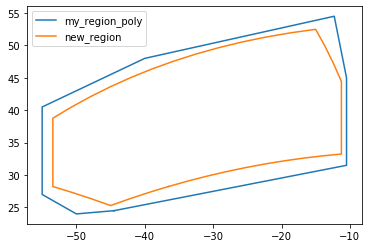

In [35]:
## Version 1: pop out the lower left so it looks more like enax4v1
vertices = ((-44.5, 24.5), (-10.5, 31.5), (-10.5, 45), (-12.3, 54.5),
            (-40, 48), (-55, 40.5), (-55, 27), (-50, 24))
my_region_poly = Polygon(vertices)

# version 2
plt.plot(*my_region_poly.exterior.xy, label='my_region_poly')

# version 3
interior_points = []
# add complete elements interior to my_region
for x, y in zip(xx, yy):
    trial_points = [Point(x0, y0) for x0, y0 in zip(x, y)]
    if all([my_region_poly.contains(tp) for tp in trial_points]):
        interior_points.extend(trial_points)

interior_elements = [Polygon(interior_points[4*i:(4*i+4)]) for i in range(len(interior_points) // 4)]
new_region = unary_union(interior_elements)
plt.plot(*new_region.exterior.xy, label='new_region')
plt.legend()

Number of vertices: 6146
Longitude range: -177 to 180
Latitude range: -90 to 90


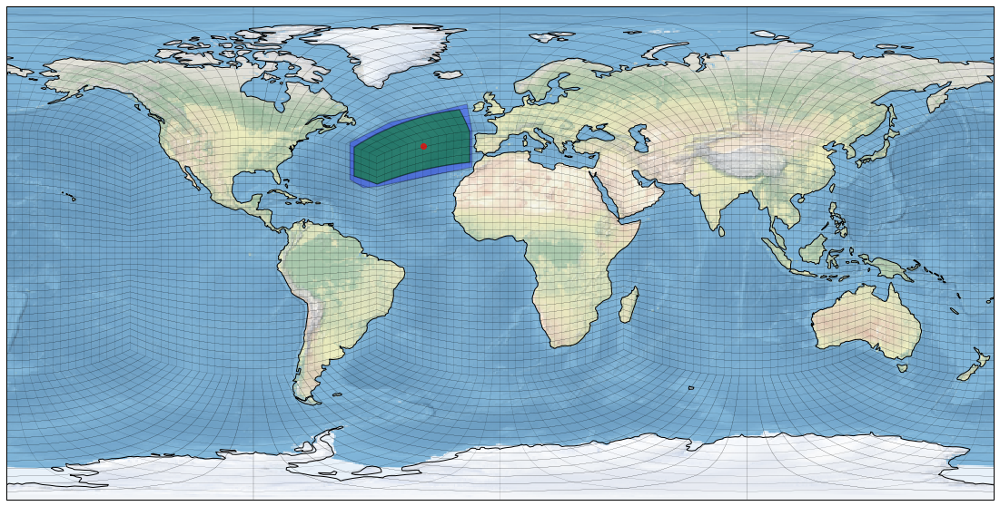

In [36]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
ax.stock_img()
ax.coastlines()
pl, ax = plot_exodus(ds_ne32, ax=ax, verbose=True, linewidth=0.1)

ax.add_geometries([my_region_poly], crs=ccrs.PlateCarree(), facecolor = 'b', edgecolor='black', alpha=0.3)
ax.add_geometries([new_region], crs=ccrs.PlateCarree(), facecolor = 'g', edgecolor='black', alpha=0.5)
ax.plot(*central_loc, marker='o', color='red', markersize=6,
        alpha=0.7, transform=ccrs.Geodetic())

2 meshes/enax4v2.g
3 meshes/enax8v2.g
4 meshes/enax16v2.g
5 meshes/enax32v2.g


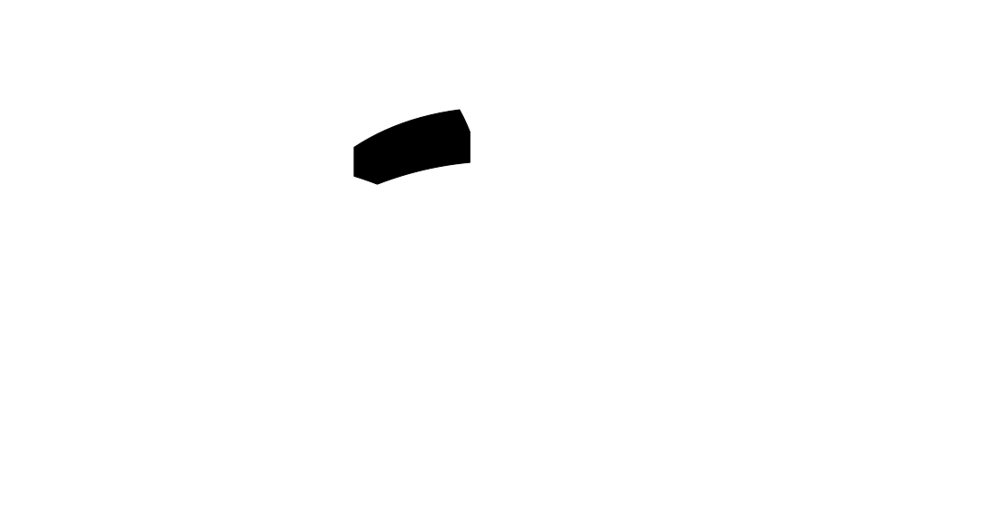

In [47]:
save_name = 'meshes/refinement_patch_v2.png'
plot_refinement_patch(new_region, save_name=save_name)

for refine_level in range(2, 6):
    mesh_name = f'meshes/enax{2 ** refine_level}v2.g'
    print(refine_level, mesh_name)
    call_squadgen(save_name, mesh_name, refine_level=str(refine_level))

meshes/enax4v2.g
Number of vertices: 8840
Longitude range: -177 to 180
Latitude range: -90 to 90
enax4v2


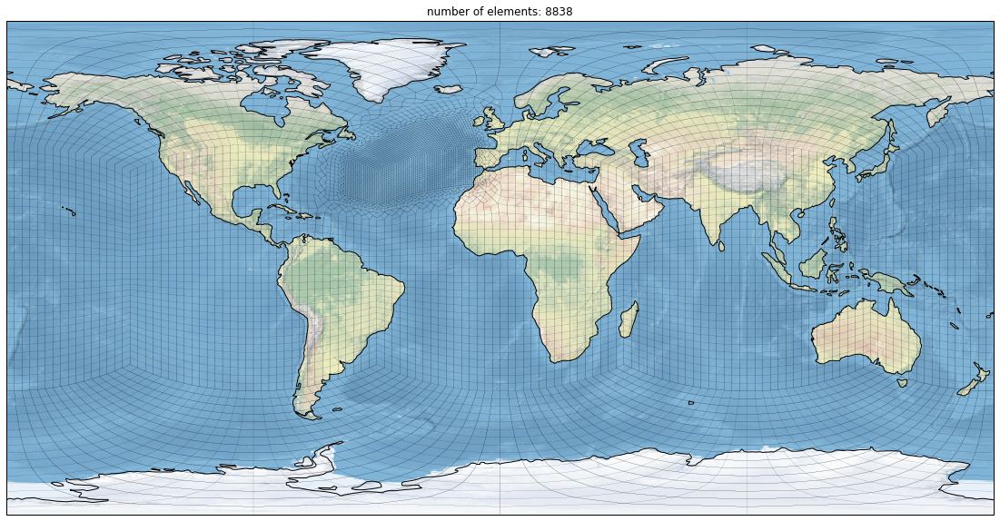

meshes/enax8v2.g
Number of vertices: 14897
Longitude range: -177 to 180
Latitude range: -90 to 90
enax8v2


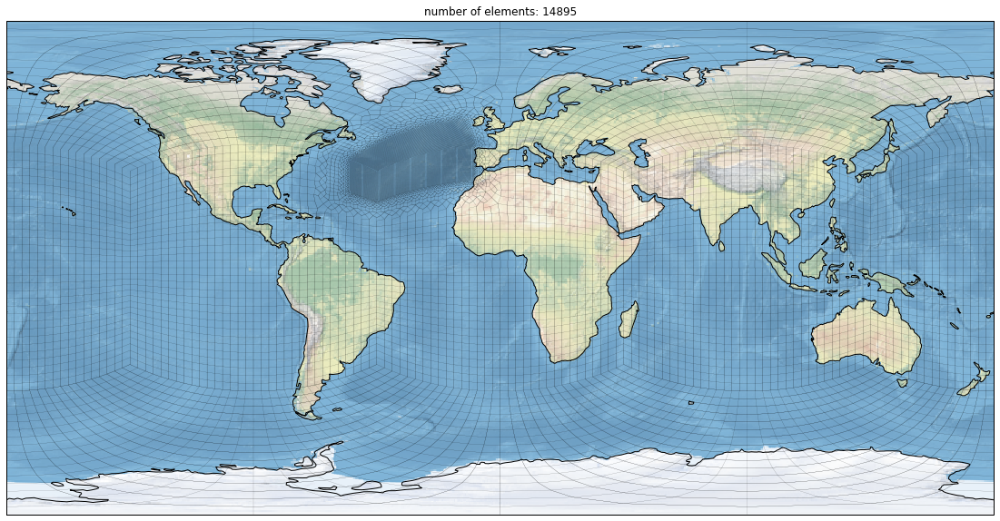

meshes/enax16v2.g
Number of vertices: 36644
Longitude range: -177 to 180
Latitude range: -90 to 90
enax16v2


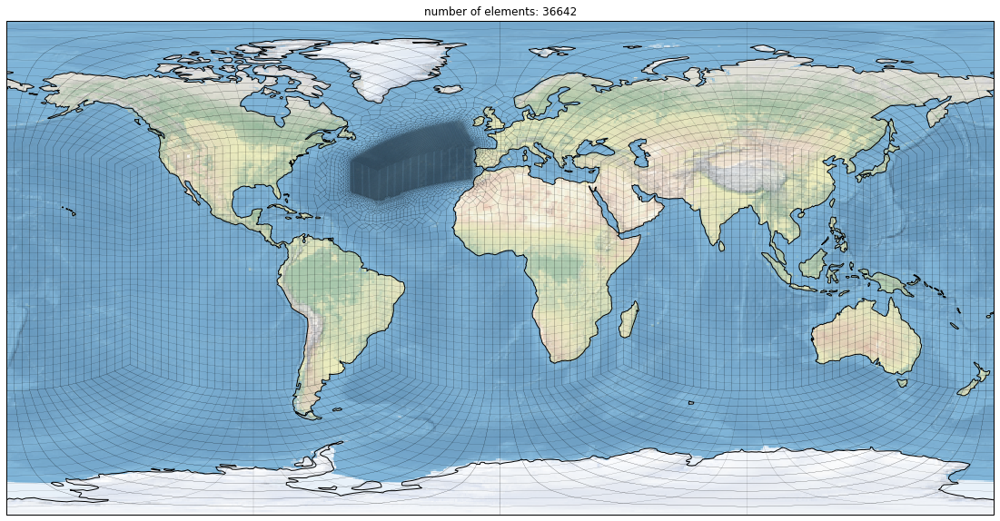

meshes/enax32v2.g
Number of vertices: 122158
Longitude range: -177 to 180
Latitude range: -90 to 90
enax32v2


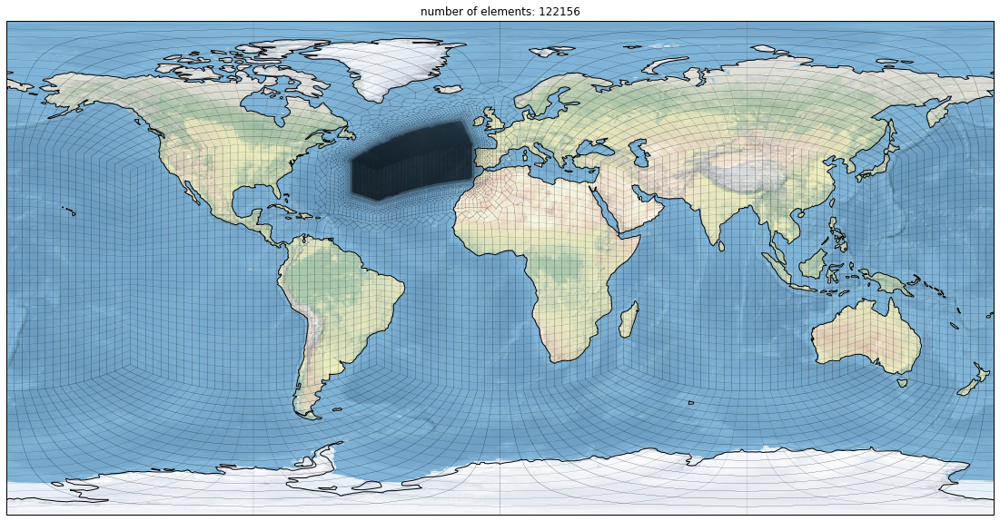

In [48]:
# plot in order of increasing refinement
meshes = sorted(glob('meshes/enax*v2.g'), key=lambda x: int(x[11:-4]))
os.makedirs('graphics', exist_ok=True)
for refined_mesh in meshes:
    print(refined_mesh)
    ds = xr.open_dataset(refined_mesh)
    fig, ax = plot_mesh_and_region(ds, region=None, central_loc=None)
    ax.set_title(f'number of elements: {ds.dims["num_elem"]}')
    out_prefix = os.path.basename(os.path.splitext(refined_mesh)[0])
    print(out_prefix)
    fig.savefig(f'graphics/{out_prefix}.pdf', bbox_inches='tight')
    fig.savefig(f'graphics/{out_prefix}.png', bbox_inches='tight')
    plt.show()

meshes/enax4v2.g
Number of vertices: 8840
Longitude range: -177 to 180
Latitude range: -90 to 90
enax4v2


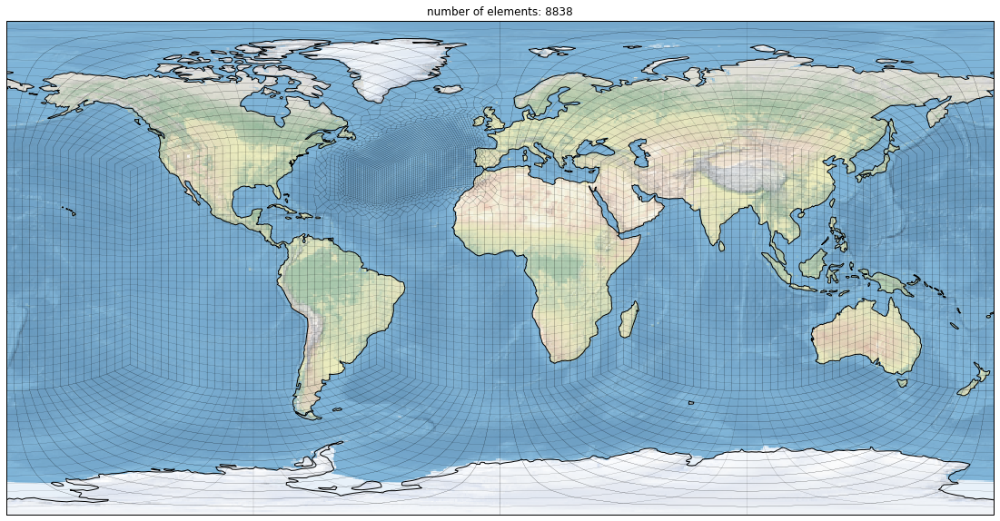

meshes/enax8v2.g
Number of vertices: 14897
Longitude range: -177 to 180
Latitude range: -90 to 90
enax8v2


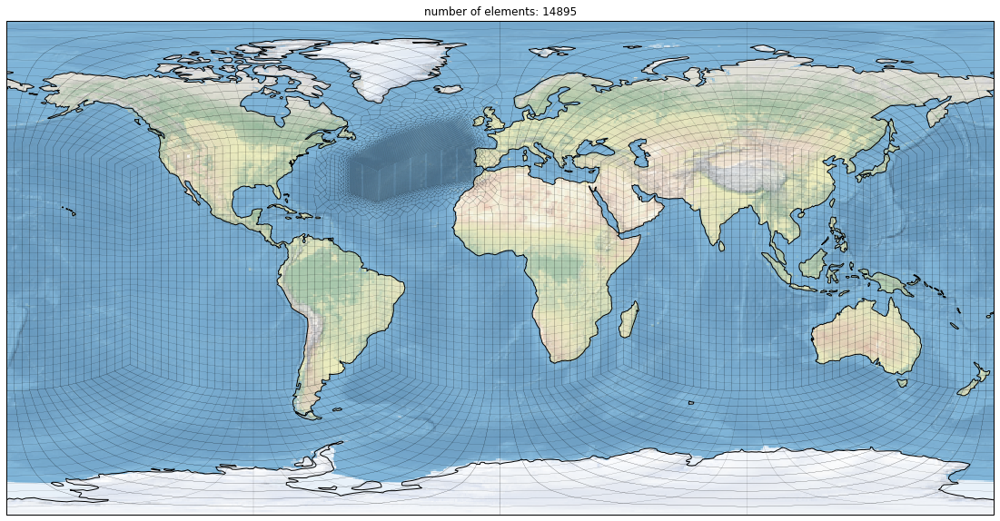

meshes/enax16v2.g
Number of vertices: 36644
Longitude range: -177 to 180
Latitude range: -90 to 90
enax16v2


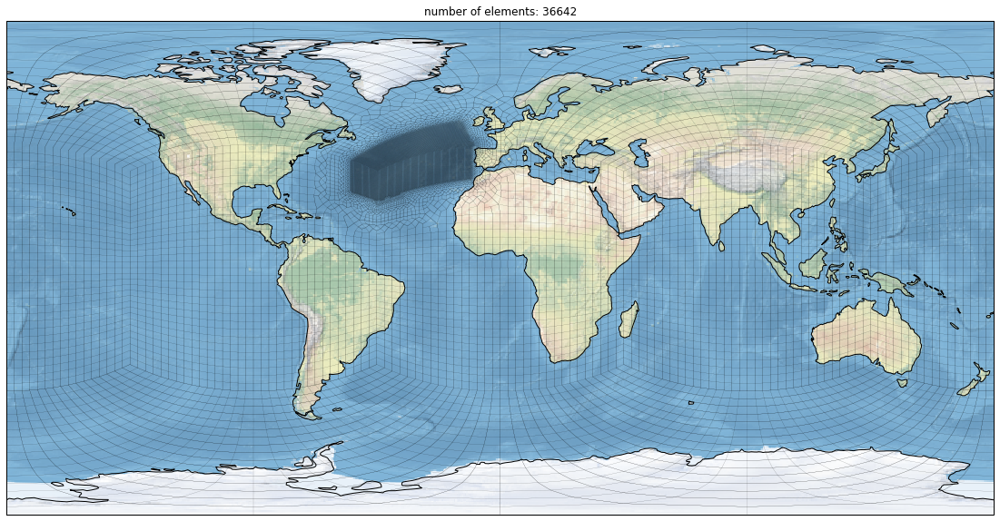

meshes/enax32v2.g
Number of vertices: 122158
Longitude range: -177 to 180
Latitude range: -90 to 90
enax32v2


In [ ]:
# plot in order of increasing refinement
meshes = sorted(glob('meshes/enax*v2.g'), key=lambda x: int(x[11:-4]))
os.makedirs('graphics', exist_ok=True)
for refined_mesh in meshes:
    print(refined_mesh)
    ds = xr.open_dataset(refined_mesh)
    fig, ax = plot_mesh_and_region(ds, region=None, central_loc=None)
    ax.set_title(f'number of elements: {ds.dims["num_elem"]}')
    out_prefix = os.path.basename(os.path.splitext(refined_mesh)[0])
    print(out_prefix)
    fig.savefig(f'graphics/{out_prefix}.pdf', bbox_inches='tight')
    fig.savefig(f'graphics/{out_prefix}.png', bbox_inches='tight')
    plt.show()